In [1]:
import os
os.environ['USE_PYGEOS'] = '0'
import sys; sys.path.insert(0, '..')
import geopandas as gpd
import xarray, rioxarray
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from rasterio import open
from rasterio.mask import mask
import matplotlib as mpl
from config import *
from rasterio.enums import Resampling

plt.rcParams['font.family'] = ['Palatino']
plt.rcParams['font.size'] = 14
%config InlineBackend.figure_format = 'retina'
year = 2021
eur = gpd.read_file(r"../data/cities/europe.geojson")

def get_cities(year):
    year = get_prior_year(year)
    return gpd.read_file(r"../data/cities/{}/clean/cities.geojson".format(year))


def get_prior_year(year):
    if year >= 2020:
        year = 2020
    elif (year >= 2015) and (year < 2020):
        year = 2015
    elif (year >= 2010) and (year < 2015):
        year = 2010
    elif (year >= 2005) and (year < 2010):
        year = 2005
    return year

cities = get_cities(year).rename(columns={'year': 'city_ref_year'})

In [2]:
pop = rioxarray.open_rasterio(r"../data/population/{}/pop.tif".format(year)).sel(band=1)
pop = pop.rio.write_nodata(np.nan)
pop = pop.rio.clip(eur.geometry.values)
pop.values = pop.values.astype(np.dtype("float32"))
pop.values[pop.values == pop.rio.nodata] = 0

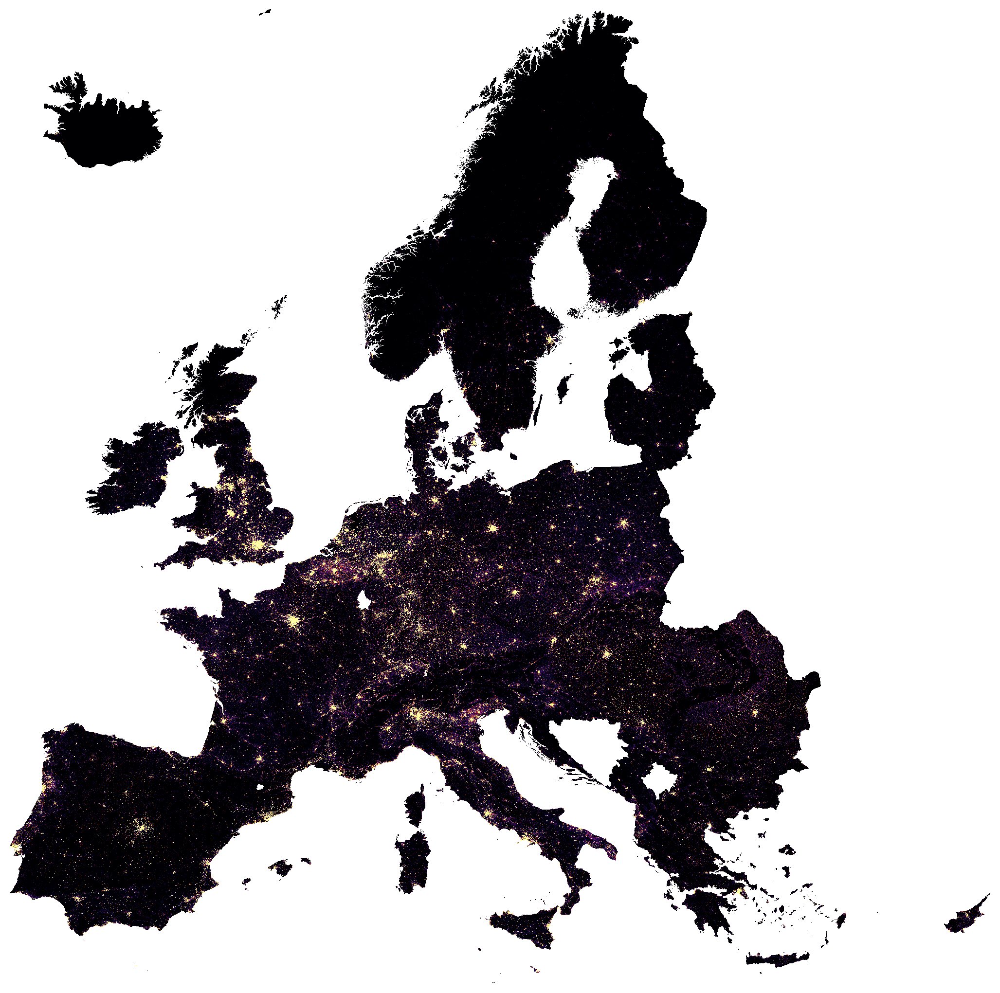

In [3]:
f, ax = plt.subplots(1, 1, figsize=(13, 13))
pop.plot.imshow(ax=ax, add_colorbar=False, robust=True, cmap='inferno')
# eur.boundary.plot(ax=ax, color='lightgreen', linewidth=0.15)
ax.set_axis_off();
ax.set_title("");
# f.savefig(r"../figures/eurpop.png", dpi=300)

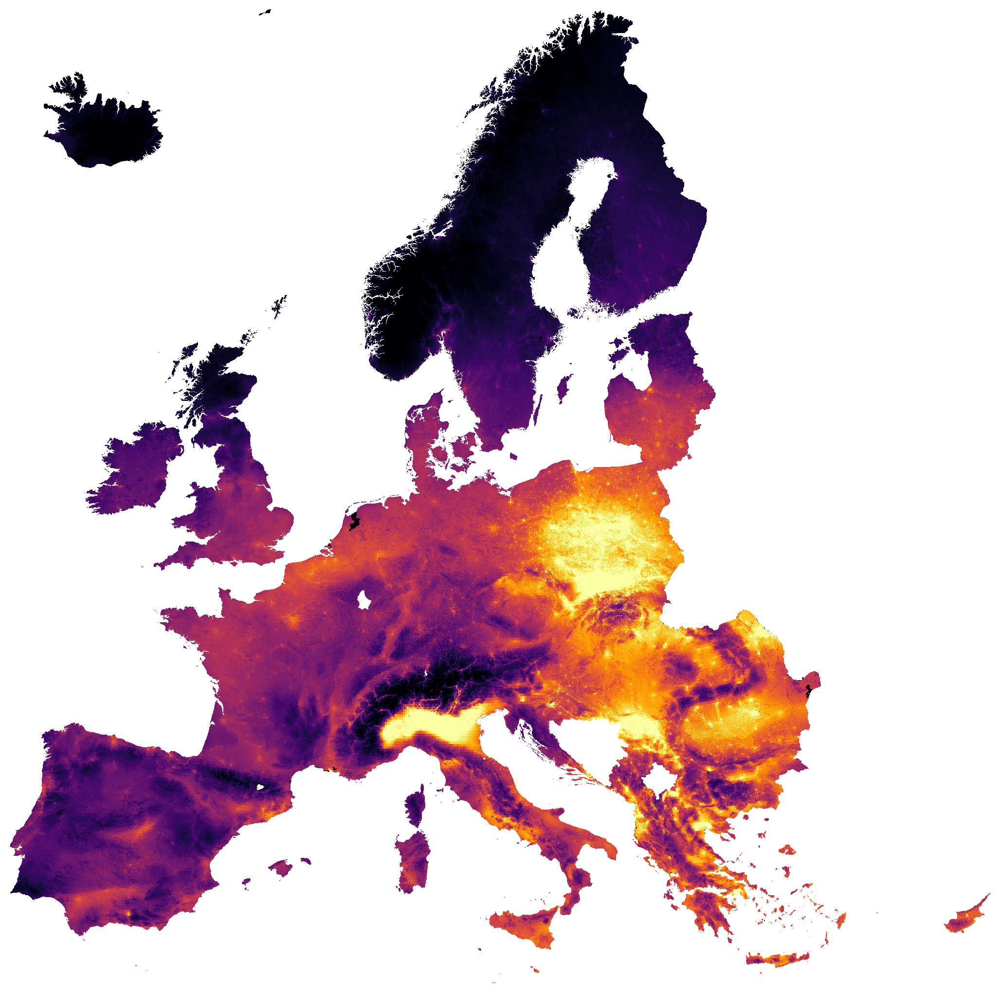

In [4]:
pol = rioxarray.open_rasterio(r"../data/pollution/{}/pol.tif".format(year)).sel(band=1)
pol = pol.rio.write_nodata(np.nan)
pol = pol.rio.clip(eur.geometry.values)
pol.values = pol.values.astype(np.dtype("float32"))
pol.values[pol.values == pol.rio.nodata] = 0
f, ax = plt.subplots(1, 1, figsize=(13, 13))
pol.plot.imshow(ax=ax, add_colorbar=False, robust=True, cmap='inferno')
ax.set_axis_off();
ax.set_title("");
f.savefig(r"../figures/eurpol.png", dpi=300)

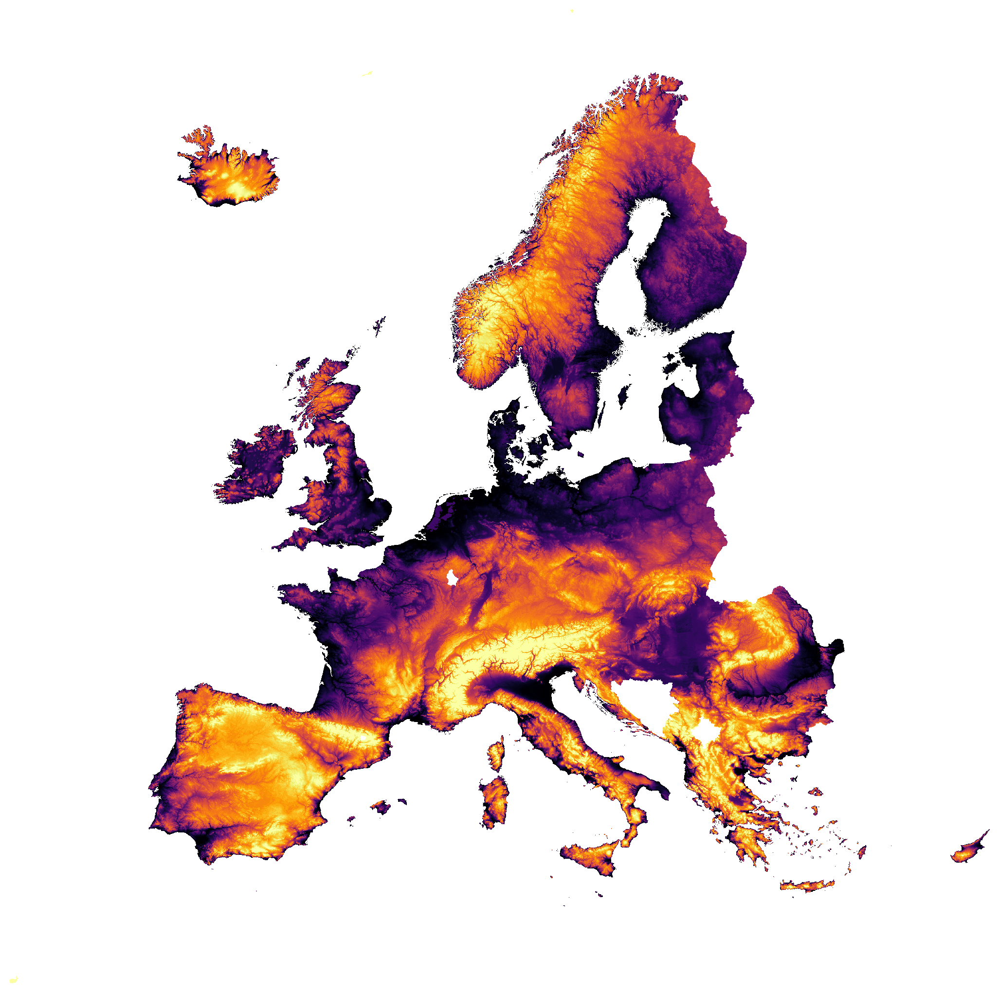

In [5]:
pol = rioxarray.open_rasterio(r"../data/controls/geographical/elevation/elevationeurope1x1.tif").sel(band=1).rio.reproject("EPSG:3035")

pol.values = pol.values.astype(float)
pol= pol.rio.write_nodata(np.nan)
pol = pol.rio.clip(eur.geometry.values)
pol.values = pol.values.astype(np.dtype("float32"))
pol.values[pol.values == pol.rio.nodata] = 0
f, ax = plt.subplots(1, 1, figsize=(13, 13))
pol.plot.imshow(ax=ax, add_colorbar=False, robust=True, cmap='inferno')
ax.set_axis_off();
ax.set_title("");
f.savefig(r"../figures/elevation_map.png", dpi=300)

In [6]:
from shapely.geometry import box
pop = rioxarray.open_rasterio(r"../data/population/{}/pop.tif".format(year)).sel(band=1)
city_dict = {"London": 496, "Paris": 334, "Milan": 149}
cr = cities.to_crs(4326)
popr = pop.rio.reproject(4326)

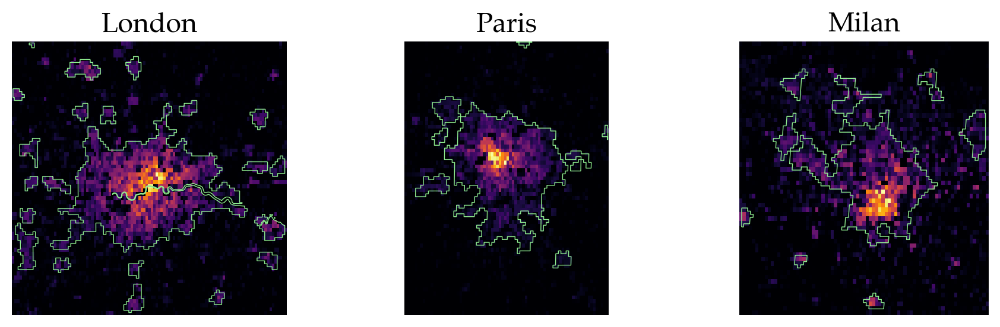

In [7]:
tol = 0.2
f, ax = plt.subplots(1, 3, figsize=(11, 3))

for i, xx in enumerate(ax.ravel()):

    city_name = list(city_dict)[i]
    city_id = list(city_dict.values())[i]
    city = cr[cr.id == city_id]
    bounds = city.total_bounds
    country_box = box(*bounds)
    buffered_box = country_box.buffer(tol)
    
    clipped_pop = popr.rio.clip_box(*buffered_box.bounds)
    clipped_pop.plot.imshow(ax=xx, add_colorbar=False, robust=False, cmap='inferno');
    cr.clip(buffered_box.bounds).boundary.plot(ax=xx, color='lightgreen', linewidth=0.5)
    xx.set_axis_off();
    xx.set_title(city_name);
f.savefig(r"../figures/cities_pop.png", dpi=300, pad_inches=0);

In [8]:
cities = gpd.read_file(r"../data/cities/{}/clean/cities.geojson".format(2020)).to_crs(4326)
lzes = gpd.read_file(r"../data/uar/uar_data_new_euro.geojson").to_crs(4326)

/Users/nicoforteza/Desktop/gis_density/venv/lib/python3.9/site-packages/pyogrio/raw.py:198: RuntimeWarning: Several features with id = 551 have been found. Altering it to be unique. This warning will not be emitted anymore for this layer
  return ogr_read(


In [9]:
id_ = 334

In [10]:
city = cr[cr.id == id_]

In [11]:
polr = pol.rio.reproject(4326)

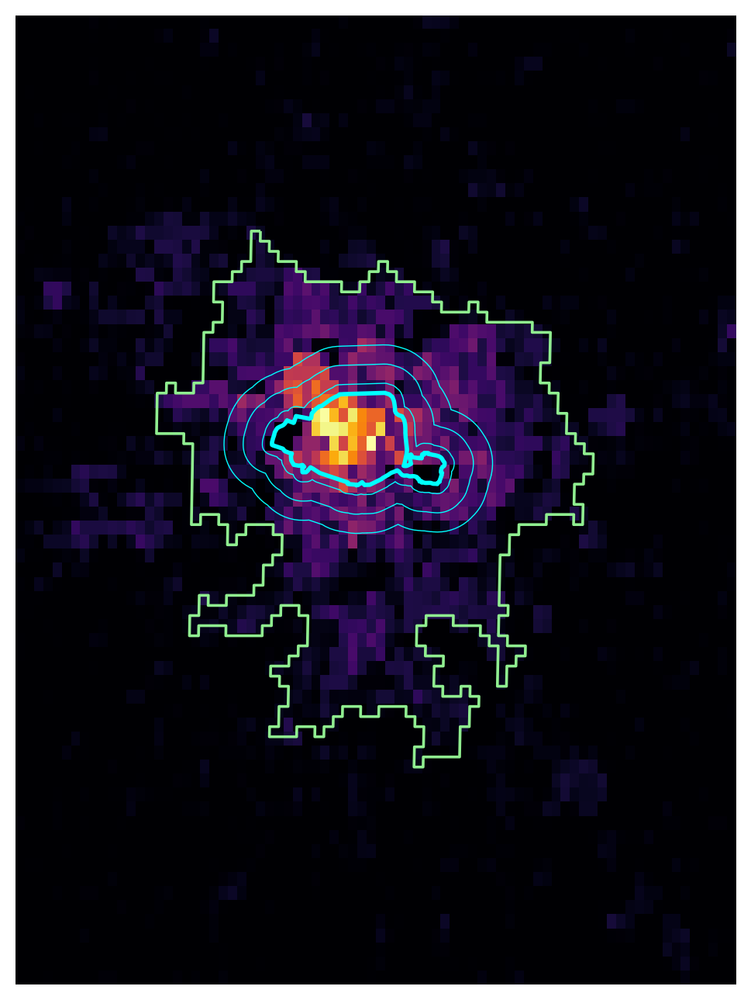

In [12]:
lze = lzes.sjoin(city)
city = cr[cr.id == id_]

f, ax = plt.subplots(1, 1, figsize=(6, 9))
ring_size = [1e3, 3e3, 5e3]
lze.boundary.plot(color='cyan', ax=ax, linewidth=2)
for ring in ring_size:
    lze.to_crs(3035).buffer(ring).to_crs(4326).boundary.plot(color='cyan', ax=ax, linewidth=.5)
    
bounds = city.total_bounds
country_box = box(*bounds)
buffered_box = country_box.buffer(tol)
popr = pop.rio.reproject(4326)

clipped_pop = popr.rio.clip_box(*buffered_box.bounds)
clipped_pop.plot.imshow(ax=ax, add_colorbar=False, robust=False, cmap='inferno');
city.boundary.plot(ax=ax, color='lightgreen', linewidth=1.3)    

ax.set_axis_off();
ax.set_title("");
f.savefig(r"../figures/paris_lez_spillovers.png", dpi=300, pad_inches=0);

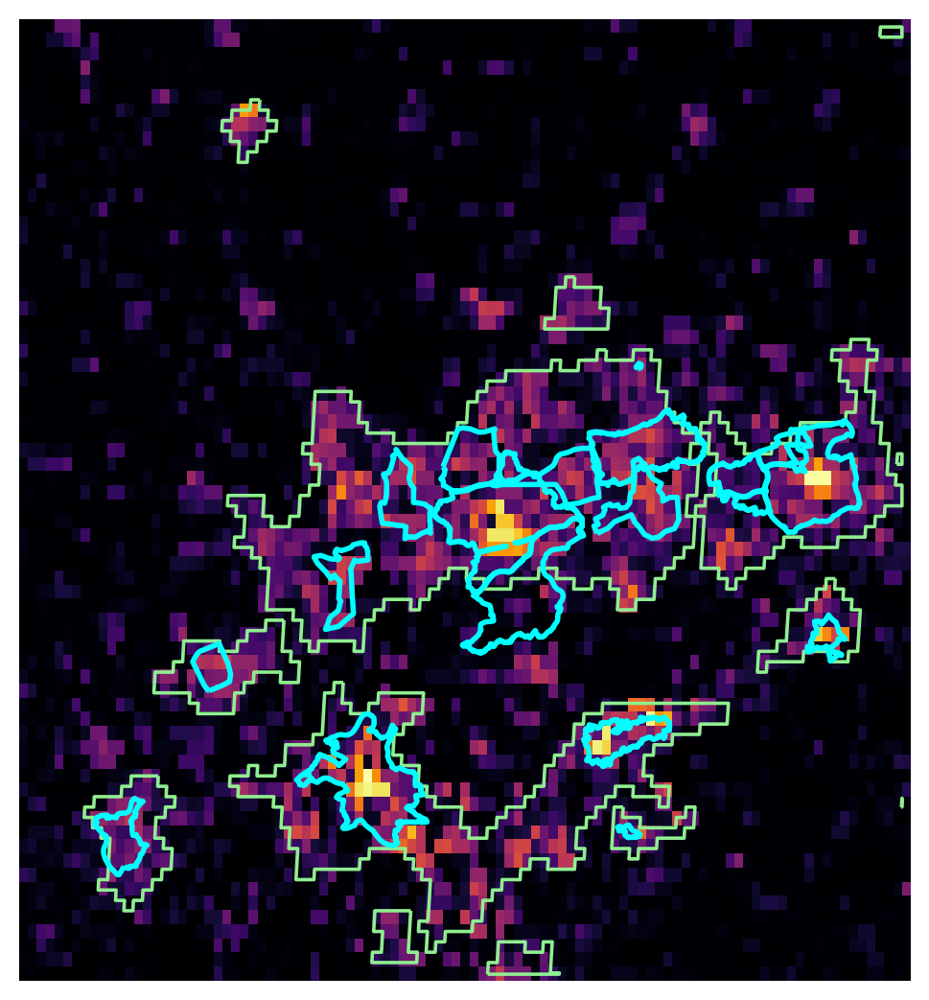

In [13]:
tol=.3

id_ = 460

city = cr[cr.id == id_]

f, ax = plt.subplots(1, 1, figsize=(6, 9))
ring_size = [1e3, 3e3, 5e3]

bounds = city.total_bounds
country_box = box(*bounds)
buffered_box = country_box.buffer(tol)

clipped_pop = popr.rio.clip_box(*buffered_box.bounds)
clipped_pop.plot.imshow(ax=ax, add_colorbar=False, robust=False, cmap='inferno');
cr.clip(buffered_box.bounds).boundary.plot(ax=ax, color='lightgreen', linewidth=1.3)  

lze = lzes.sjoin(cr.clip(buffered_box.bounds))
lze.boundary.plot(color='cyan', ax=ax, linewidth=2)
# for ring in ring_size:
#    lze.to_crs(3035).buffer(ring).to_crs(4326).boundary.plot(color='cyan', ax=ax, linewidth=.5)

ax.set_axis_off();
ax.set_title("");
f.savefig(r"../figures/dusseldorf_lez.png", dpi=300, pad_inches=0);

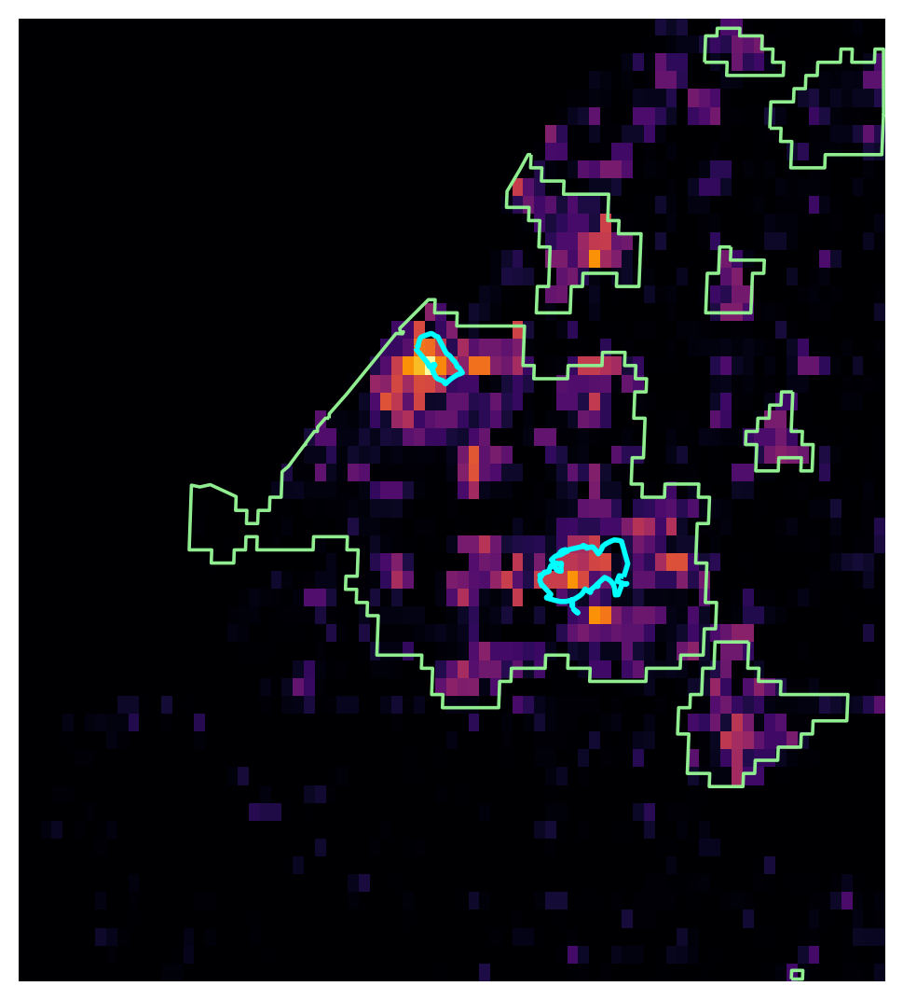

In [14]:
tol=.2

id_ = 497

city = cr[cr.id == id_]

f, ax = plt.subplots(1, 1, figsize=(6, 9))
ring_size = [1e3, 3e3, 5e3]

bounds = city.total_bounds
country_box = box(*bounds)
buffered_box = country_box.buffer(tol)

clipped_pop = popr.rio.clip_box(*buffered_box.bounds)
clipped_pop.plot.imshow(ax=ax, add_colorbar=False, robust=False, cmap='inferno');
cr.clip(buffered_box.bounds).boundary.plot(ax=ax, color='lightgreen', linewidth=1.3)  

lze = lzes.sjoin(cr.clip(buffered_box.bounds))
lze.boundary.plot(color='cyan', ax=ax, linewidth=2)
# for ring in ring_size:
#    lze.to_crs(3035).buffer(ring).to_crs(4326).boundary.plot(color='cyan', ax=ax, linewidth=.5)

ax.set_axis_off();
ax.set_title("");
# f.savefig(r"../figures/rotterdam_lez_spillovers.png", dpi=300, pad_inches=0);

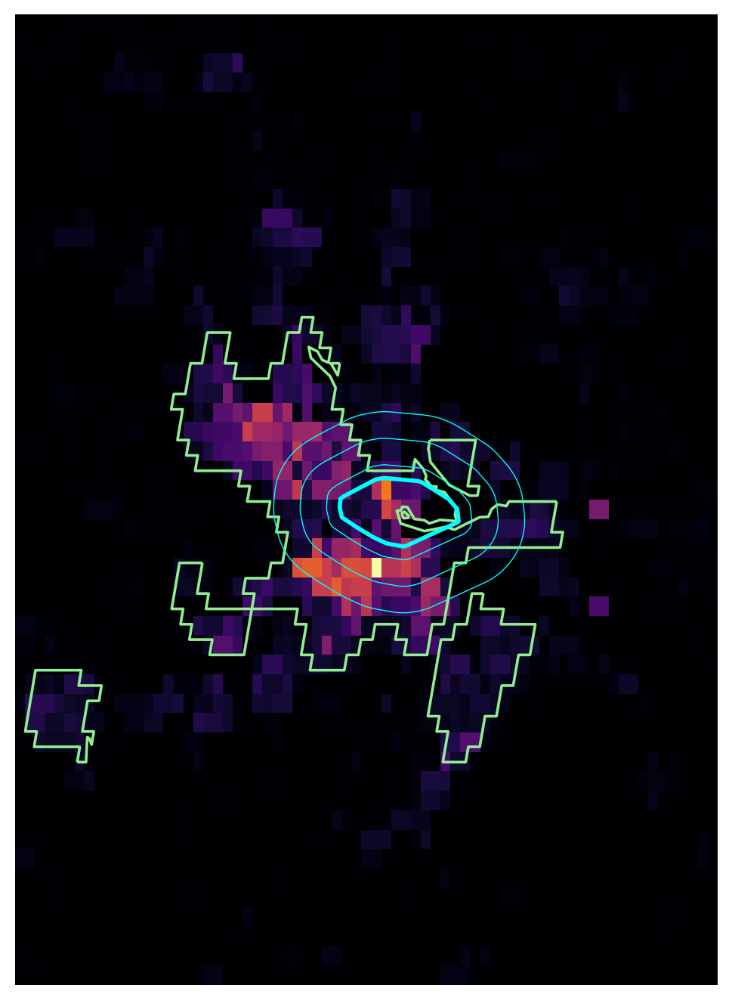

In [15]:
tol=.2

id_ = 811

city = cr[cr.id == id_]

f, ax = plt.subplots(1, 1, figsize=(6, 9))
ring_size = [1e3, 3e3, 5e3]

bounds = city.total_bounds
country_box = box(*bounds)
buffered_box = country_box.buffer(tol)

clipped_pop = popr.rio.clip_box(*buffered_box.bounds)
clipped_pop.plot.imshow(ax=ax, add_colorbar=False, robust=False, cmap='inferno');
cr.clip(buffered_box.bounds).boundary.plot(ax=ax, color='lightgreen', linewidth=1.3)  

lze = lzes.sjoin(cr.clip(buffered_box.bounds))
lze.boundary.plot(color='cyan', ax=ax, linewidth=2)
for ring in ring_size:
    lze.to_crs(3035).buffer(ring).to_crs(4326).boundary.plot(color='cyan', ax=ax, linewidth=.5)

ax.set_axis_off();
ax.set_title("");
f.savefig(r"../figures/stockholm_lez_spillovers.png", dpi=300, pad_inches=0);

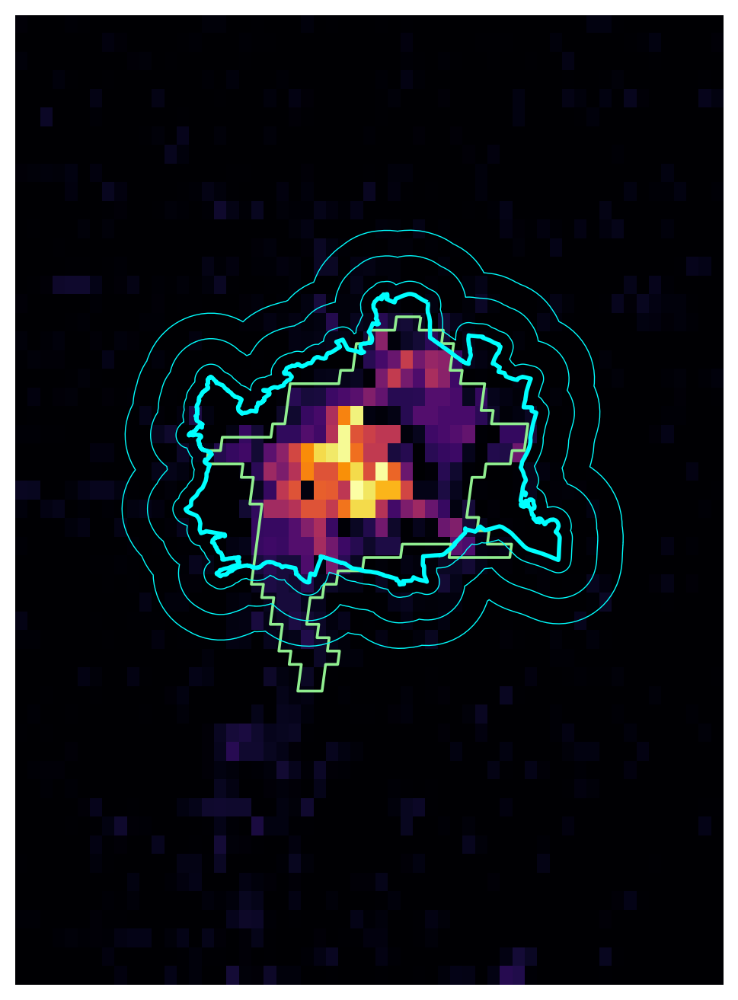

In [16]:

tol=.2

id_ = 322

city = cr[cr.id == id_]

f, ax = plt.subplots(1, 1, figsize=(6, 9))
ring_size = [1e3, 3e3, 5e3]

bounds = city.total_bounds
country_box = box(*bounds)
buffered_box = country_box.buffer(tol)

clipped_pop = popr.rio.clip_box(*buffered_box.bounds)
clipped_pop.plot.imshow(ax=ax, add_colorbar=False, robust=False, cmap='inferno');
cr.clip(buffered_box.bounds).boundary.plot(ax=ax, color='lightgreen', linewidth=1.3)  

lze = lzes.sjoin(cr.clip(buffered_box.bounds))
lze.boundary.plot(color='cyan', ax=ax, linewidth=2)
for ring in ring_size:
    lze.to_crs(3035).buffer(ring).to_crs(4326).boundary.plot(color='cyan', ax=ax, linewidth=.5)

ax.set_axis_off();
ax.set_title("");
f.savefig(r"../figures/vienna_lez_spillovers.png", dpi=300, pad_inches=0);

In [17]:
madmun = gpd.read_file(r"../data/cities/madrid_muni/Madrid_ETRS89.shp")

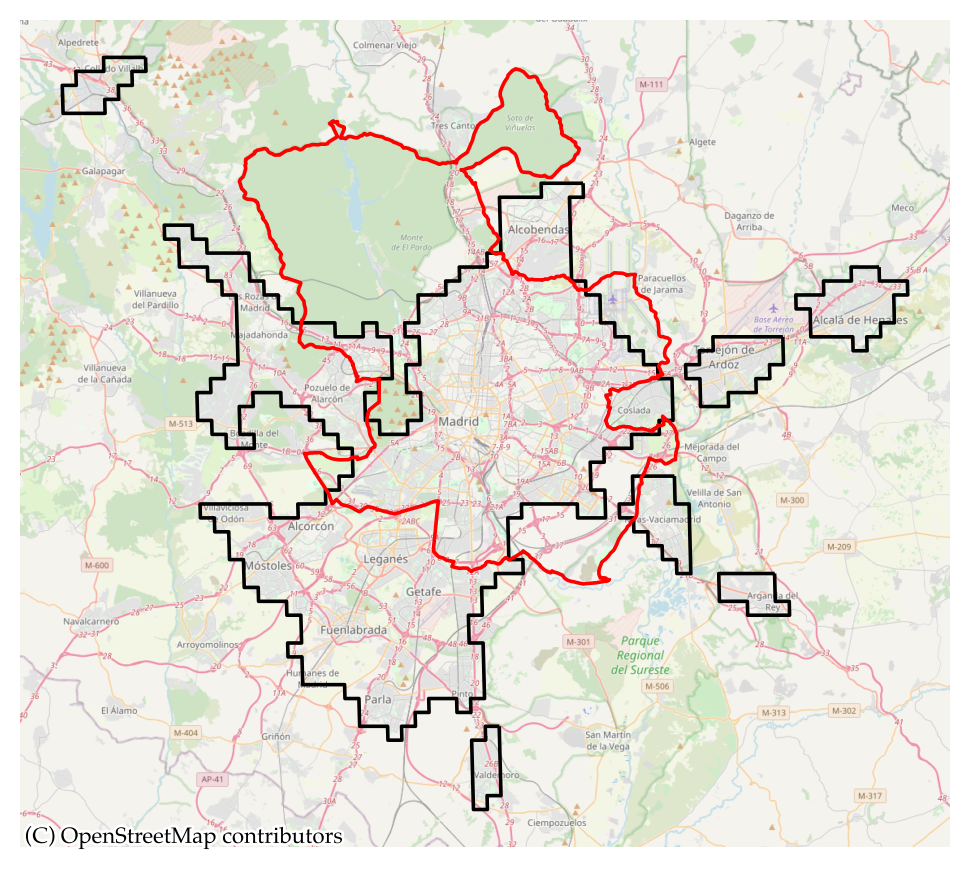

In [18]:
import contextily
tol=.2

id_ = 186

city = cr[cr.id == id_]

f, ax = plt.subplots(1, 1, figsize=(6, 9))
ring_size = [1e3, 3e3, 5e3]

bounds = city.total_bounds
country_box = box(*bounds)
buffered_box = country_box.buffer(tol)

# clipped_pop = popr.rio.clip_box(*buffered_box.bounds)
# clipped_pop.plot.imshow(ax=ax, add_colorbar=False, robust=False, cmap='inferno', alpha=.85);
cr.clip(buffered_box.bounds).to_crs(epsg=3857).boundary.plot(ax=ax, color='black', linewidth=1.3)  
madmun.to_crs(epsg=3857).boundary.plot(ax=ax, color='red', linewidth=1.3);
contextily.add_basemap(
    ax,
    source=contextily.providers.OpenStreetMap.Mapnik,
    zoom=11,
    alpha=.75
)

ax.set_axis_off();
ax.set_title("");
f.savefig(r"../figures/madrid_city_muni.png", dpi=300, pad_inches=0, bbox_inches='tight');

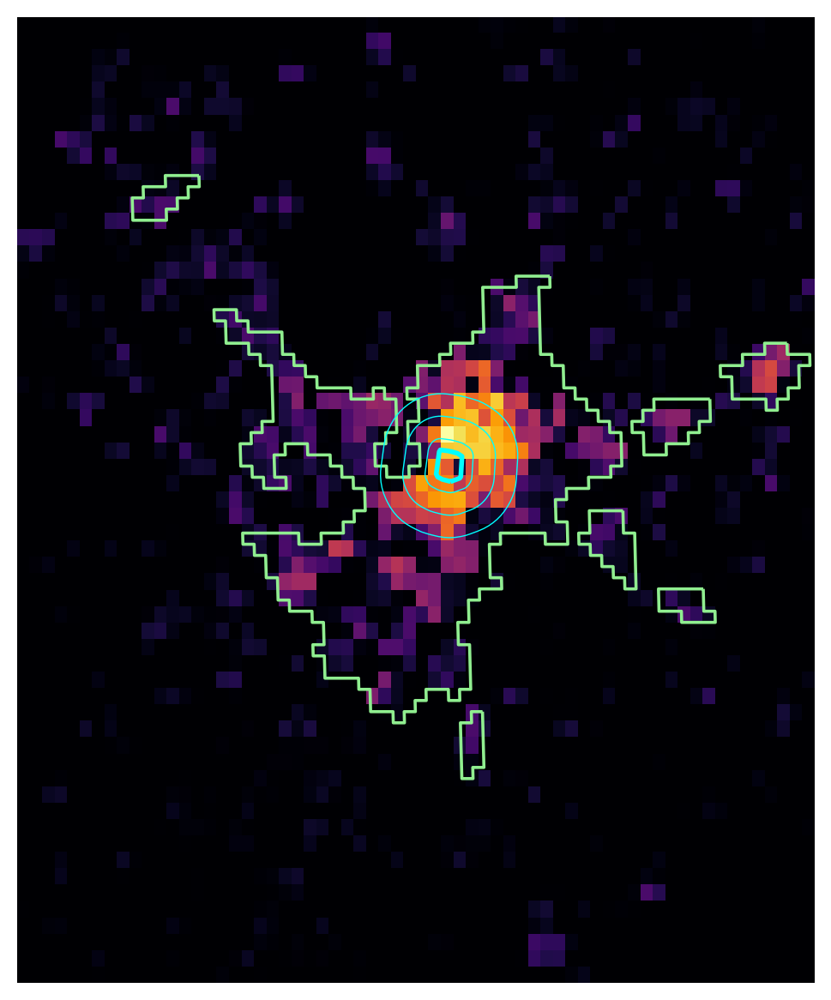

In [25]:
tol=.2

id_ = 186

city = cr[cr.id == id_]

f, ax = plt.subplots(1, 1, figsize=(6, 9))
ring_size = [1e3, 3e3, 5e3]

bounds = city.total_bounds
country_box = box(*bounds)
buffered_box = country_box.buffer(tol)

clipped_pop = popr.rio.clip_box(*buffered_box.bounds)
clipped_pop.plot.imshow(ax=ax, add_colorbar=False, robust=False, cmap='inferno');
cr.clip(buffered_box.bounds).boundary.plot(ax=ax, color='lightgreen', linewidth=1.3)  

lze = lzes.sjoin(cr.clip(buffered_box.bounds))
lze.boundary.plot(color='cyan', ax=ax, linewidth=2)
for ring in ring_size:
    lze.to_crs(3035).buffer(ring).to_crs(4326).boundary.plot(color='cyan', ax=ax, linewidth=.5)

ax.set_axis_off();
ax.set_title("");
f.savefig(r"../figures/madrid_lez_spillovers.png", dpi=300, pad_inches=0);

In [ ]:
tol=.2

id_ = 186

city = cr[cr.id == id_]

f, ax = plt.subplots(1, 1, figsize=(6, 9))
ring_size = [1e3, 3e3, 5e3]

bounds = city.total_bounds
country_box = box(*bounds)
buffered_box = country_box.buffer(tol)

clipped_pop = popr.rio.clip_box(*buffered_box.bounds)
clipped_pop.plot.imshow(ax=ax, add_colorbar=False, robust=False, cmap='inferno');
cr.clip(buffered_box.bounds).boundary.plot(ax=ax, color='lightgreen', linewidth=1.3)  

lze = lzes.sjoin(cr.clip(buffered_box.bounds))
lze.boundary.plot(color='cyan', ax=ax, linewidth=2)
for ring in ring_size:
    lze.to_crs(3035).buffer(ring).to_crs(4326).boundary.plot(color='cyan', ax=ax, linewidth=.5)

ax.set_axis_off();
ax.set_title("");
# f.savefig(r"../figures/madrid_lez_spillovers.png", dpi=300, pad_inches=0);

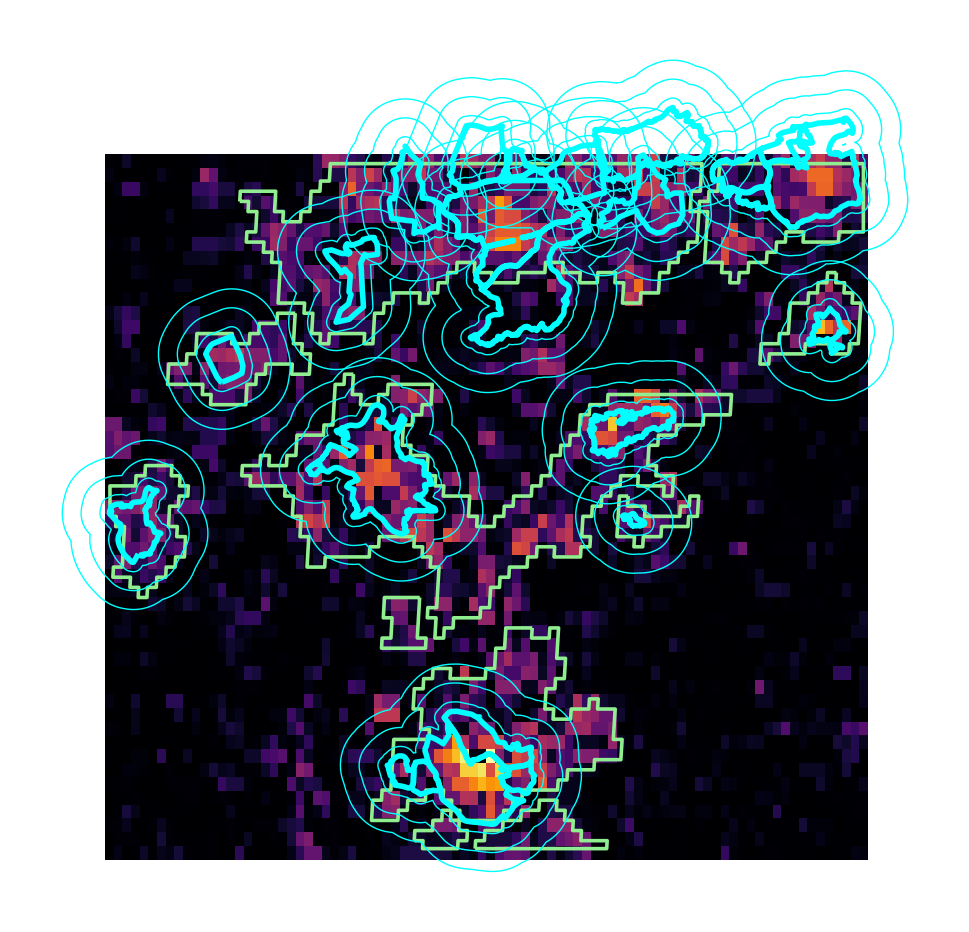

In [138]:
tol=.2

id_ = 435

city = cr[cr.id == id_]

f, ax = plt.subplots(1, 1, figsize=(6, 9))
ring_size = [1e3, 3e3, 5e3]

bounds = city.total_bounds
country_box = box(*bounds)
buffered_box = country_box.buffer(tol)

clipped_pop = popr.rio.clip_box(*buffered_box.bounds)
clipped_pop.plot.imshow(ax=ax, add_colorbar=False, robust=False, cmap='inferno');
cr.clip(buffered_box.bounds).boundary.plot(ax=ax, color='lightgreen', linewidth=1.3)  

lze = lzes.sjoin(cr.clip(buffered_box.bounds))
lze.boundary.plot(color='cyan', ax=ax, linewidth=2)
for ring in ring_size:
    lze.to_crs(3035).buffer(ring).to_crs(4326).boundary.plot(color='cyan', ax=ax, linewidth=.5)

ax.set_axis_off();
ax.set_title("");
f.savefig(r"../figures/dusseldorf_lez_spillovers.png", dpi=300, pad_inches=0);

/var/folders/96/pfnryzjx5b38w_m76576rr_c0000gn/T/ipykernel_27564/3510764787.py:20: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc='lower center', ncols=2, frameon=False, bbox_to_anchor=(0.5, -0.1));


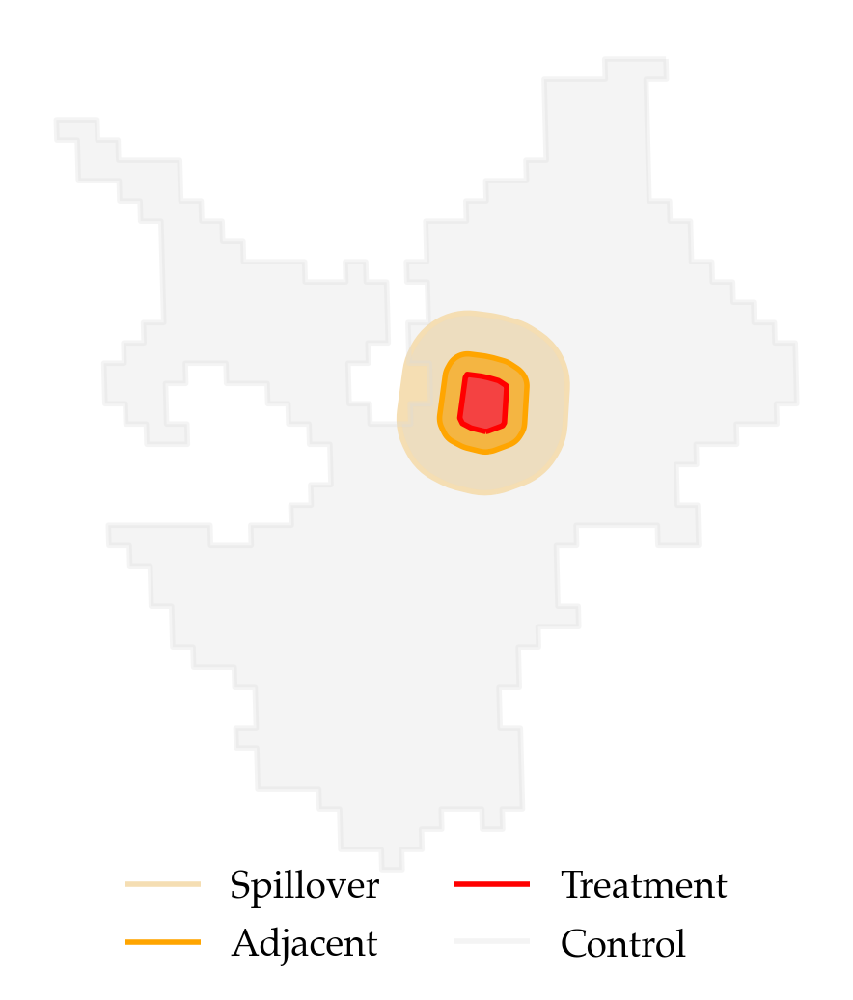

In [66]:
lze = lzes.sjoin(city)
city = cr[cr.id == id_]

f, ax = plt.subplots(1, 1, figsize=(6, 6))
ring_size = [1e3, 3e3]


lze.to_crs(3035).buffer(3e3).to_crs(4326).plot(color='wheat', ax=ax, linewidth=2, label='Spillover')
lze.to_crs(3035).buffer(3e3).to_crs(4326).boundary.plot(color='wheat', ax=ax, linewidth=2, label='Spillover')
lze.to_crs(3035).buffer(1e3).to_crs(4326).plot(color='orange', ax=ax, linewidth=2, label='Adjacent')
lze.to_crs(3035).buffer(1e3).to_crs(4326).boundary.plot(color='orange', ax=ax, linewidth=2, label='Adjacent')
lze.plot(color='red', ax=ax, linewidth=2, label='Treatment')
lze.boundary.plot(color='red', ax=ax, linewidth=2, label='Treatment')

city.plot(ax=ax, color='gainsboro', linewidth=2, label='Control', alpha=.3)    
city.boundary.plot(ax=ax, color='gainsboro', linewidth=2, label='Control', alpha=.3)    

ax.set_axis_off();
ax.set_title("");
ax.legend(loc='lower center', ncols=2, frameon=False, bbox_to_anchor=(0.5, -0.1));
f.savefig(r"../figures/madrid_strategy.png", dpi=300, pad_inches=0);